In [1]:
import os
import timeit
import tqdm
import seaborn as sns
import scanpy as sc
import anndata
import squidpy as sq
import decoupler as dc
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd

plt.rcdefaults()
sc.set_figure_params()
plt.rcParams['axes.grid'] = False
plt.rcParams['figure.figsize'] = (5,5)

from distance import calc_all_neighbors, calc_lm_on_samples
from deconvolution import calc_leiden_on_deconv, get_dense_clusters, calc_utest
from run_decoupler import calc_decoupler, get_activities,\
get_activities_per_group, get_geneset_pairs
from plot_funcs import *

all plot_funcs functions are available via
```
import plot_funcs
dir(plot_funcs)
```

# load data

In [2]:
p='/sc/arion/projects/HIMC/reference/single_cell_references/CRC_Merad_lab'

In [3]:
adata=sc.read_h5ad(f'{p}/visium.h5ad')

In [4]:
adata

AnnData object with n_obs × n_vars = 19528 × 17943
    obs: 'in_tissue', 'array_row', 'array_col', 'pathologist_annotation', 'cell_num', 'singler', 'samples'
    uns: 'spatial'
    obsm: 'spatial'

In [5]:
deconv=pd.read_csv(f'{p}/visium_deconv.csv',index_col=0)

In [6]:
deconv.head(3)

,Tumor cE01 (Stem/TA-like),Tumor cE02 (Stem/TA-like/Immature Goblet),Tumor cE03 (Stem/TA-like prolif),Tumor cE04 (Enterocyte 1),Tumor cE05 (Enterocyte 2),Tumor cE06 (Immature Goblet),Tumor cE07 (Goblet/Enterocyte),Tumor cE08 (Goblet),Tumor cE09 (Best4),Tumor cE10 (Tuft),...,cTNI17 (gd-like T),cTNI18 (gd-like T PDCD1+),cTNI19 (gd-like T prolif),cTNI20 (PLZF+ T),cTNI21 (PLZF+ T prolif),cTNI22 (cTNI22),cTNI23 (NK CD16A+),cTNI24 (NK GZMK+),cTNI25 (NK XCL1+),cTNI26 (ILC3)
AAACAGAGCGACTCCT-1_MIME22_BIC18-A5_0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AAACAGGGTCTATATT-1_MIME22_BIC18-A5_0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AAACCCGAACGAAATC-1_MIME22_BIC18-A5_0,16.620792,2.728002,28.089024,0.645445,3.555189,0.026663,0.307238,0.416739,2.045653,1.645724,...,0.049736,0.035469,0.083225,0.023816,0.117061,0.034603,0.029606,0.035814,0.056953,0.054548


# neighborhood

you can calculate `neighborhood` and `intra-neighborhood` on AnnData with multiple samples or on AnnData with one visium image. 
intra-neighbrhood is layers inside area of interest.

```
# how to choose one sample
sample='MIME22_BIC21-A6_0'
adata_test=adata[adata.obs['samples']==sample]
adata_test.uns['spatial']={
    s:adata_test.uns['spatial'][s] \
    for s,v in adata_test.uns['spatial'].items() \
    if s==sample
}
deconv_test=deconv.reindex(adata_test.obs_names)
```

In [7]:
adata.obs['samples'].unique()

['MIME22_BIC18-A5_0', 'MIME22_BIC18-A7_0', 'MIME22_BIC21-A5_0', 'MIME22_BIC21-A6_0', 'MIME22_BIC31-B4_0', 'MIME22_BIC31B6-V2_0']
Categories (6, object): ['MIME22_BIC18-A5_0', 'MIME22_BIC18-A7_0', 'MIME22_BIC21-A5_0', 'MIME22_BIC21-A6_0', 'MIME22_BIC31-B4_0', 'MIME22_BIC31B6-V2_0']

In [8]:
ad=calc_all_neighbors(adata=adata,
                      cat='pathologist_annotation',
                      celltype='Tumor',
                      n=1,
                      sample_obs_key='samples',
                      samples=['MIME22_BIC21-A5_0','MIME22_BIC21-A6_0'],
                      noncumulative=True,
                      add_intra=False,
                      intra_only=False)

/usr/local/lib/python3.8/dist-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


Running MIME22_BIC21-A5_0 sample


  0%|          | 0/2 [00:00<?, ?it/s]

Coordinates of neighbors are added in adata.obs['neighborhood_0_c']


 50%|█████     | 1/2 [00:00<00:00,  1.64it/s]

Coordinates of neighbors are added in adata.obs['neighborhood_0_nc']
Cumulative neighborhood at the 100 micrometers distance is not calculated. Running it now.


100%|██████████| 2/2 [00:10<00:00,  5.33s/it]
/usr/local/lib/python3.8/dist-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


Coordinates of neighbors are added in adata.obs['neighborhood_1_c']
Coordinates of neighbors are added in adata.obs['neighborhood_1_nc']
Running MIME22_BIC21-A6_0 sample


  0%|          | 0/2 [00:00<?, ?it/s]

Coordinates of neighbors are added in adata.obs['neighborhood_0_c']


 50%|█████     | 1/2 [00:00<00:00,  1.90it/s]

Coordinates of neighbors are added in adata.obs['neighborhood_0_nc']
Cumulative neighborhood at the 100 micrometers distance is not calculated. Running it now.


100%|██████████| 2/2 [00:08<00:00,  4.01s/it]

Coordinates of neighbors are added in adata.obs['neighborhood_1_c']
Coordinates of neighbors are added in adata.obs['neighborhood_1_nc']


In [9]:
ad

AnnData object with n_obs × n_vars = 8022 × 17943
    obs: 'in_tissue', 'array_row', 'array_col', 'pathologist_annotation', 'cell_num', 'singler', 'samples', 'neighborhood_0_c_MIME22_BIC21-A5_0', 'neighborhood_0_nc_MIME22_BIC21-A5_0', 'neighborhood_1_c_MIME22_BIC21-A5_0', 'neighborhood_1_nc_MIME22_BIC21-A5_0', 'neighborhood_0_c_MIME22_BIC21-A6_0', 'neighborhood_0_nc_MIME22_BIC21-A6_0', 'neighborhood_1_c_MIME22_BIC21-A6_0', 'neighborhood_1_nc_MIME22_BIC21-A6_0'
    uns: 'spatial'
    obsm: 'spatial'

/usr/local/lib/python3.8/dist-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/usr/local/lib/python3.8/dist-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


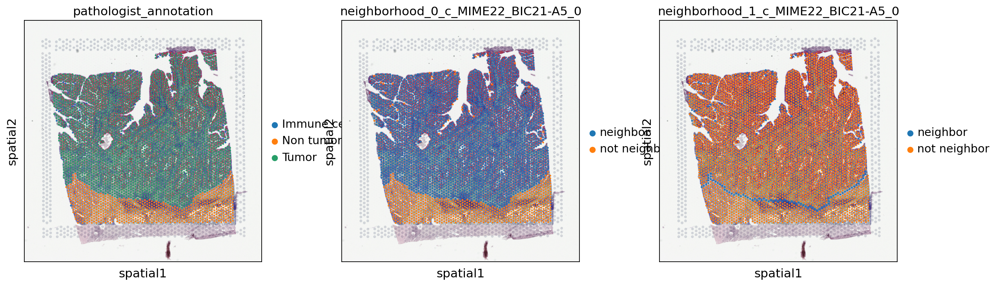

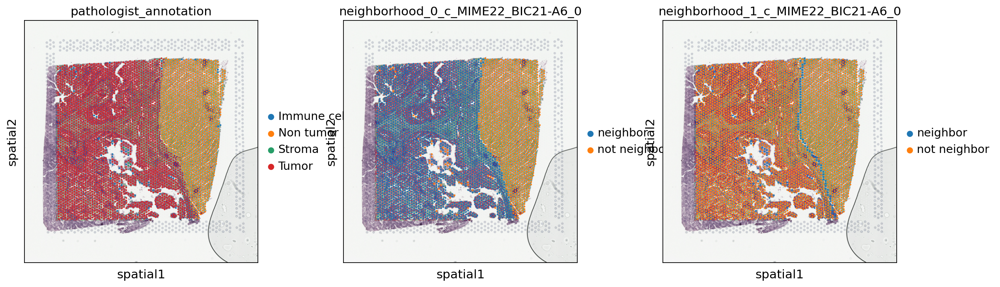

In [10]:
plot_spatial_scatter(ad,'samples',None,False,
                     *['pathologist_annotation',
                       *[f'neighborhood_{i}_c_{s}' \
                         for i in range(2) \
                         for s in ['MIME22_BIC21-A5_0','MIME22_BIC21-A6_0']
                        ]
                      ]
                     )

plot neghborhood composition for several samples using `plot_neighborhood_composition_n_samples` or `plot_neighborhood_composition` for AnnData with one sample

/usr/local/lib/python3.8/dist-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


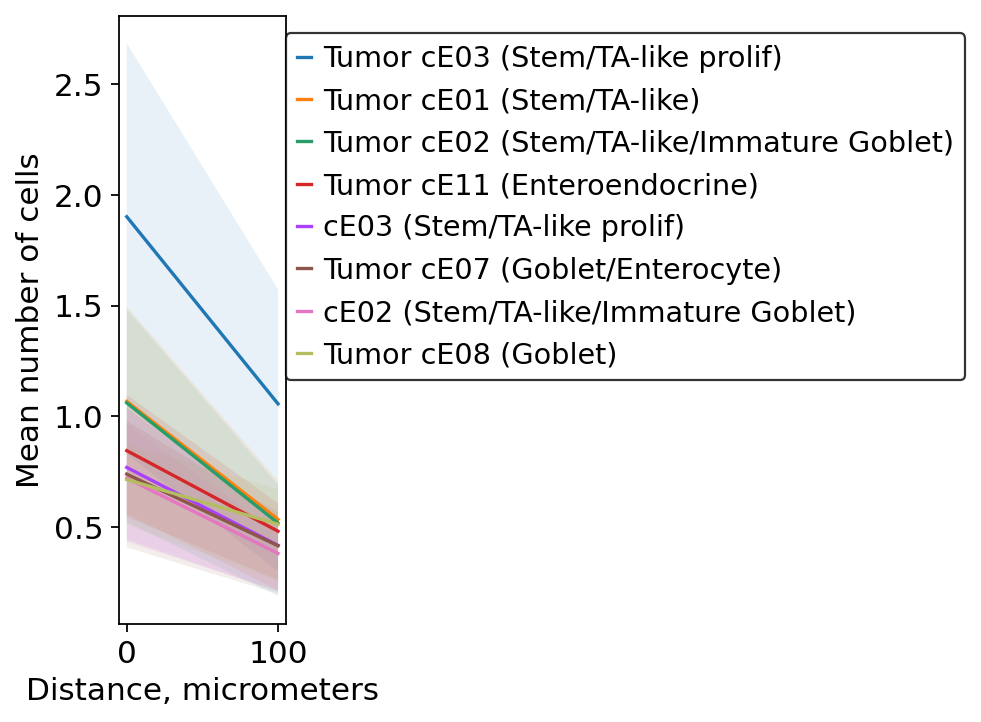

/usr/local/lib/python3.8/dist-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


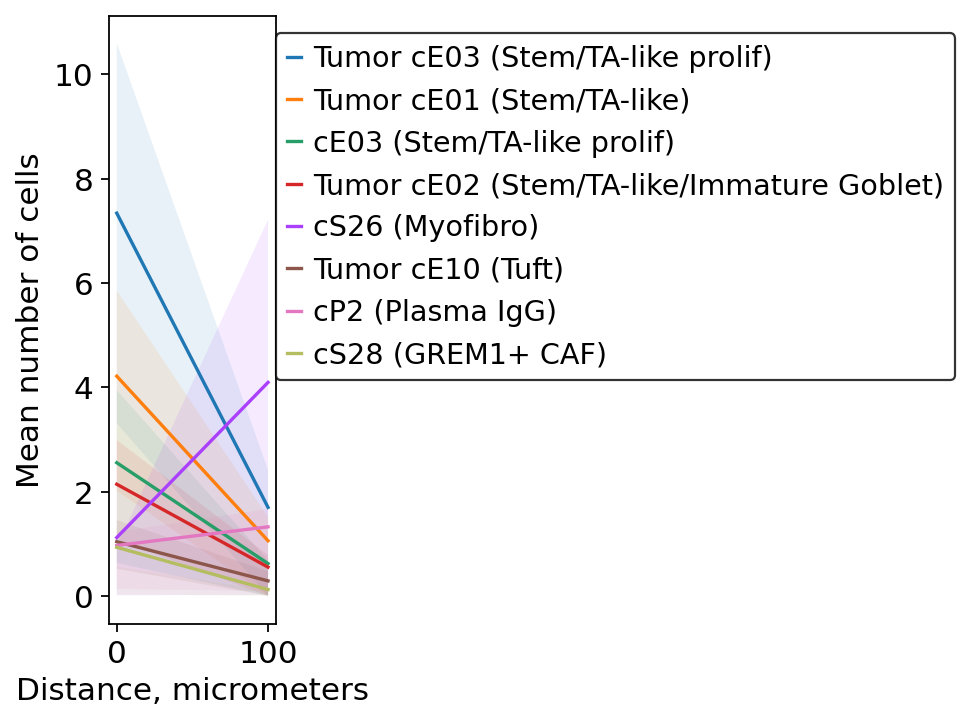

In [11]:
plot_neighborhood_composition(adata=ad,
                              deconv=deconv,
                              sample_obs_key='samples',
                              samples=['MIME22_BIC21-A5_0','MIME22_BIC21-A6_0'],
                              noncumulative=True,
                              intra=False)

then we can regress gene expression of each gene against distance and find gene set that drives the difference across the distance.\
`GLM` is implemented here. `MixedLM` is coming soon.

In [12]:
a=calc_lm_on_samples(adata=ad,
                     sample_obs_key='samples',
                     samples=['MIME22_BIC21-A5_0','MIME22_BIC21-A6_0'],
                     use_mixedlm=False)

Running GLM.
Calculating linear model on MIME22_BIC21-A5_0 sample.


/usr/local/lib/python3.8/dist-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


Length of genes of interest = 94


100%|██████████| 94/94 [00:00<00:00, 98.47it/s]
/usr/local/lib/python3.8/dist-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


Applying Benjamini/Hochberg multiple correction.
Number of tested genes = 94, number of retained genes after adjustment = 94.
Calculating linear model on MIME22_BIC21-A6_0 sample.
Length of genes of interest = 205


100%|██████████| 205/205 [00:02<00:00, 97.91it/s]

Applying Benjamini/Hochberg multiple correction.
Number of tested genes = 205, number of retained genes after adjustment = 205.


In [13]:
a

{'MIME22_BIC21-A5_0': AURKAIP1    (3.5255093060613575e-24,)
 ENO1         (2.423078038722643e-10,)
 IFI6         (6.398880878784581e-24,)
 ATP5IF1     (1.4559145003273845e-18,)
 AKR1A1        (5.94663309673547e-29,)
                       ...            
 PSMA7         (8.74032134682185e-13,)
 DIDO1        (7.364362940359344e-26,)
 APP           (5.41321739632899e-12,)
 POLR2F       (1.324805787471689e-16,)
 TMSB4X       (0.0020702001269267854,)
 Length: 94, dtype: object,
 'MIME22_BIC21-A6_0': AURKAIP1    (1.4715419405037731e-21,)
 PARK7         (6.25609167332376e-13,)
 ENO1         (6.734306627630867e-17,)
 IFI6         (9.050154336663018e-21,)
 ATP5IF1     (3.9033657078091728e-22,)
                       ...            
 CD99         (1.397803946033789e-26,)
 TMSB4X      (2.4816518331152828e-26,)
 RBM3         (5.658128739282704e-16,)
 ARMCX3      (1.3070877487335735e-20,)
 FLNA         (5.241329503818005e-19,)
 Length: 205, dtype: object}

In [14]:
s='MIME22_BIC21-A6_0'
adata_tmp=adata[adata.obs['samples']==s,a[s].index]
# adata_tmp=adata[:,a.index]

you can then apply pathway enrichment analysis and look which pathways are best describe these genes.

In [15]:
ad_dc=calc_decoupler(adata=adata_tmp,
                     msigdb_collection=[],
                     ora=True,
                     precomp=False)

# load pd.Series with genesets for every pathway
gs=get_geneset_pairs(adata=adata_tmp,
                     msigdb_collection=[])

/hpc/users/radkee01/.local/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Normalizing, log-transforming.
Loading pre-loaded progeny database
Running progeny
Progeny failed
Loading pre-loaded dorothea database
Running dorothea
Running mlm on mat with 4030 samples and 205 targets for 35 sources.


100%|██████████| 1/1 [00:00<00:00,  7.25it/s]

Loading pre-loaded cytosig database


Running CytoSig
Running mlm on mat with 4030 samples and 205 targets for 41 sources.


100%|██████████| 1/1 [00:00<00:00, 33.72it/s]

Loading progeny


Loading dorothea


In [22]:
acts=get_activities(adata=ad_dc,
                    obsm_key='dorothea_mlm_estimate')
acts_gr=get_activities_per_group(acts=acts,
                                 group_name='pathologist_annotation')

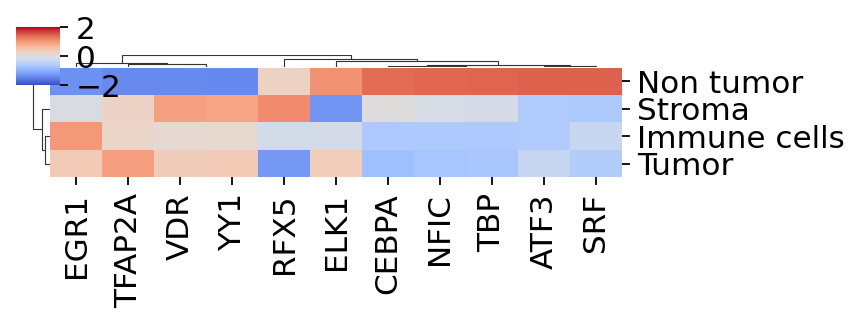

In [23]:
clustermap_of_activities(acts_gr.iloc[:,:30])

Length of genes to plot = 15


/hpc/users/radkee01/.local/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


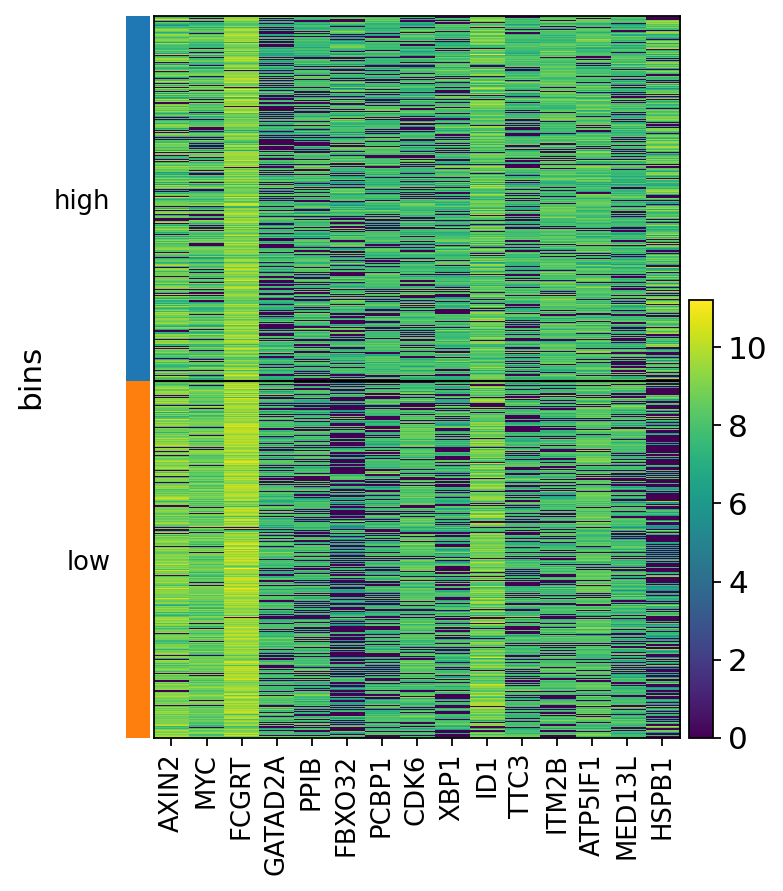

In [24]:
plot_hm_gs(activities=acts,
           adata=ad_dc,
           label='CEBPA',
           gs=gs)

## one sample example

In [25]:
samples=['MIME22_BIC21-A6_0']
adata_test=adata[adata.obs['samples'].isin(samples)]
adata_test.uns['spatial']={
    s:adata_test.uns['spatial'][s] 
    for s,v in adata_test.uns['spatial'].items() 
    if s in samples
}
deconv_test=deconv.reindex(adata_test.obs_names)

/usr/local/lib/python3.8/dist-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


In [26]:
adata_test=calc_all_neighbors(adata=adata_test,
                              cat='pathologist_annotation',
                              celltype='Tumor',
                              n=1,
                              sample_obs_key=None,
                              samples=None,
                              noncumulative=True,
                              add_intra=False,
                              intra_only=False)

  0%|          | 0/2 [00:00<?, ?it/s]

Coordinates of neighbors are added in adata.obs['neighborhood_0_c']


 50%|█████     | 1/2 [00:00<00:00,  1.90it/s]

Coordinates of neighbors are added in adata.obs['neighborhood_0_nc']
Cumulative neighborhood at the 100 micrometers distance is not calculated. Running it now.


100%|██████████| 2/2 [00:08<00:00,  4.05s/it]

Coordinates of neighbors are added in adata.obs['neighborhood_1_c']
Coordinates of neighbors are added in adata.obs['neighborhood_1_nc']


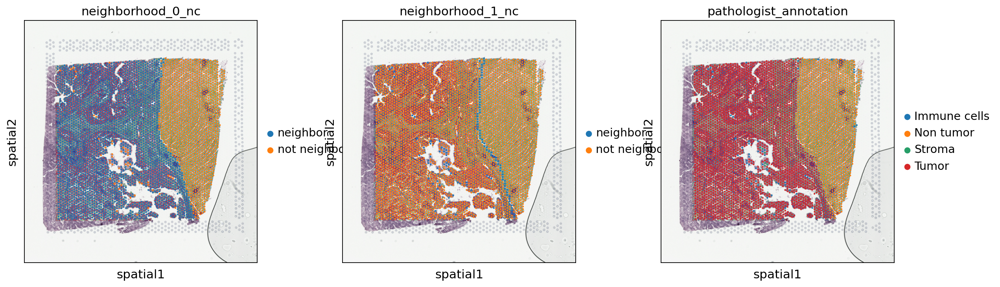

In [30]:
plot_spatial_scatter(adata_test,'samples',None,False,
                     *['neighborhood_0_nc','neighborhood_1_nc',
                       'pathologist_annotation'])

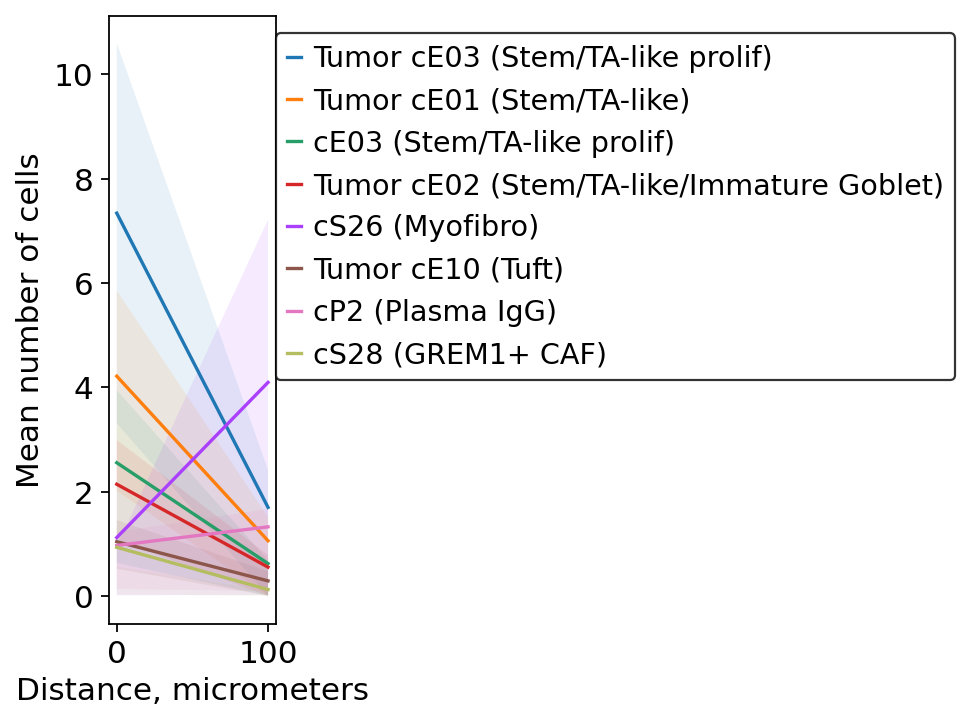

In [31]:
plot_neighborhood_composition(adata=adata_test,
                              deconv=deconv,
                              sample_obs_key=None,
                              samples=[],
                              noncumulative=True,
                              intra=False)

# deconvolution

right now leiden resolution is chosen by number of clusters (should be 9<=n<=11)

In [32]:
samples=['MIME22_BIC18-A5_0']
adata_test=adata[adata.obs['samples'].isin(samples)]
adata_test.uns['spatial']={
    s:adata_test.uns['spatial'][s] 
    for s,v in adata_test.uns['spatial'].items() 
    if s in samples
}
deconv_test=deconv.reindex(adata_test.obs_names)

/usr/local/lib/python3.8/dist-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


In [33]:
# adata_deconv=calc_leiden_on_deconv(adata,deconv,'samples',None,pre_computed_adata=False)
adata_deconv=calc_leiden_on_deconv(adata=adata_test,
                                   deconv=deconv_test,
                                   sample_obs_key=None,
                                   samples=None,
                                   pre_computed_adata=False)

/sc/arion/work/radkee01/notebooks/crc/deconvolution.py:70: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  deconv_adata=anndata.AnnData(deconv)


PCA and UMAP are calculated for deconvoluted matrix.
Optimal number of leiden clusters 9, res=0.6
Results for leiden clustering on deconvoluted matrix is saved in .obs['leiden_deconv'].
PCA, UMAP are calculated for gene expression matrix.
Optimal number of leiden clusters 7, res=1.0
Results for leiden clustering on gene expression matrix are saved in .obs['leiden'].


plot results for any .obs keys -- here: leiden clusters on gene expression matrix/deconvolution and pathologist annotation on specified samples

/usr/local/lib/python3.8/dist-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


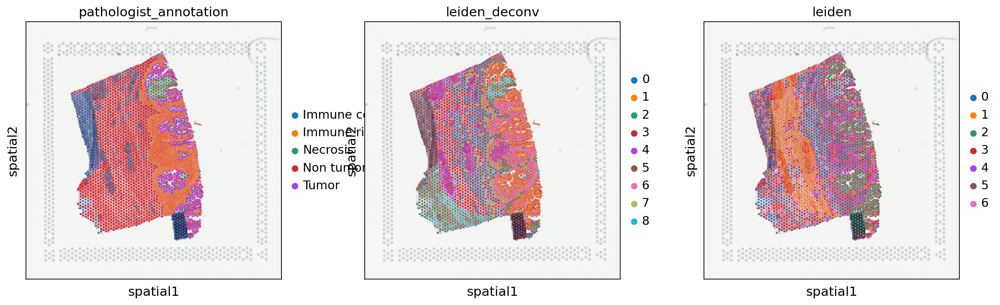

In [35]:
toplot=['pathologist_annotation','leiden_deconv','leiden']
plot_spatial_scatter(adata_deconv,'samples',samples,False,
                     *toplot)

## one sample analysis

you can plot composition of whatever cluster whatever group you want. 
here it is a all clusters in `leiden_deconv`

100%|██████████| 9/9 [00:08<00:00,  1.09it/s]


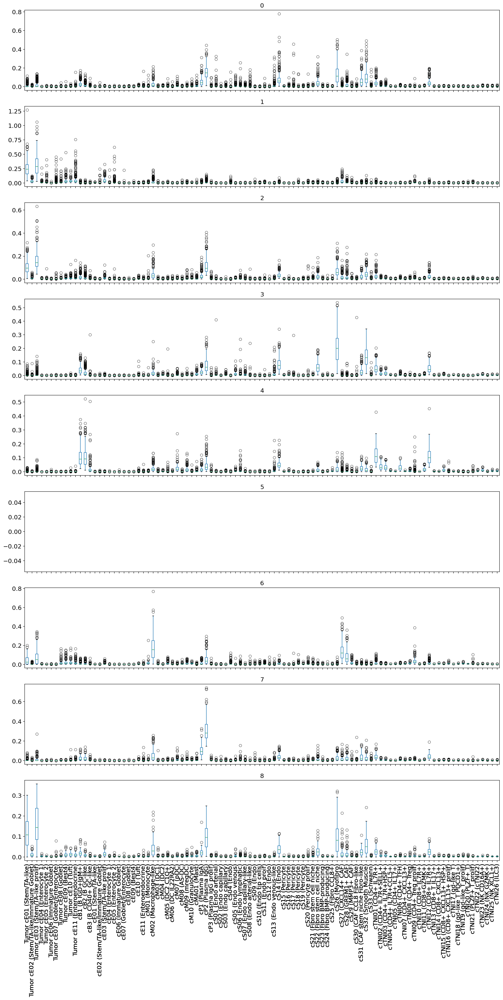

In [36]:
plot_clusters_composition(adata=adata_deconv,
                          group_name='leiden_deconv',
                          deconv=deconv_test)

and then go deep and apply DBSCAN on whatever cluster you want

In [37]:
adata_deconv=get_dense_clusters(adata=adata_deconv,
                                group_name='leiden_deconv',
                                cluster='4')

Number of dense clusters = 5
Results for DBSCAN clustering is saved in .obs['denselabels'].


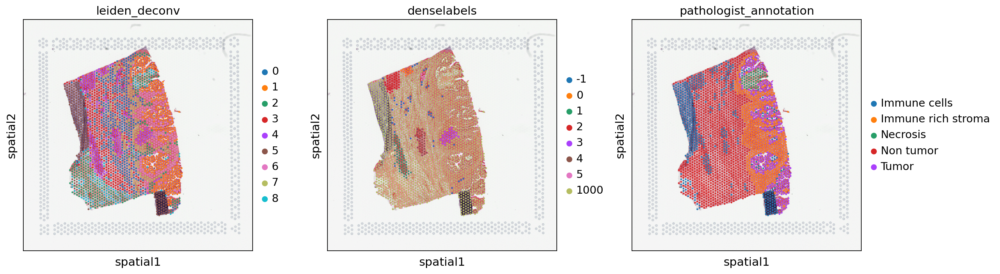

In [38]:
toplot=['leiden_deconv',
        'denselabels',
        'pathologist_annotation']
plot_spatial_scatter(adata_deconv,None,samples,False,
                     *toplot)

100%|██████████| 8/8 [00:07<00:00,  1.14it/s]


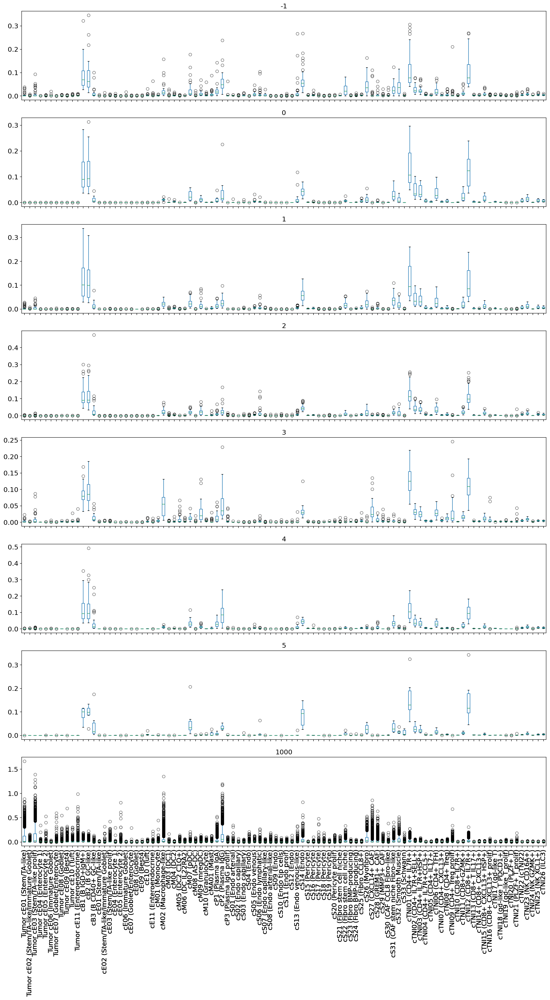

In [39]:
plot_clusters_composition(adata=adata_deconv,
                          group_name='denselabels',
                          deconv=deconv_test)

you can calculate U-statistics for one immune aggregate vs other for every cell subtype and report adjusted p-values

In [40]:
r=calc_utest(adata=adata_test,
             deconv=deconv_test,
             denselabels='denselabels',
             mcorr=True)

<AxesSubplot: >

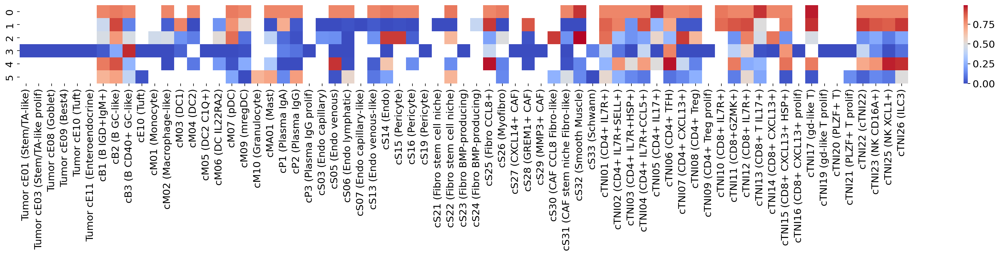

In [41]:
r=r.astype(float).dropna(how='all',axis=1)
_,axs=plt.subplots(1,1,figsize=(.4*len(r.columns),2))
sns.heatmap(r,ax=axs,cmap='coolwarm')

also you can calculate cell-cell interaction inside clusters and compare top expressed receptor-ligand pairs

Calculating CellPhoneDB on AnnData.


  0%|          | 0/10000 [00:00<?, ?permutation/s]

Calculating for dense labels. Excluding clusters `-1` and `1000`.


/sc/arion/work/radkee01/notebooks/crc/plot_funcs.py:412: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.axes.set_xticklabels(['|'.join(i) for i in rtmp.index],rotation=90)


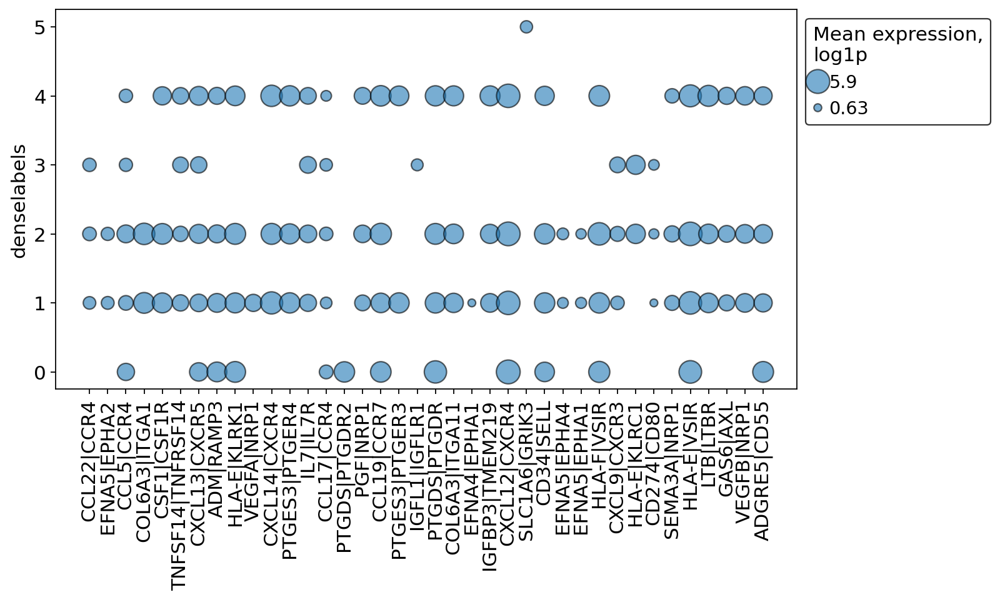

/hpc/users/radkee01/.local/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


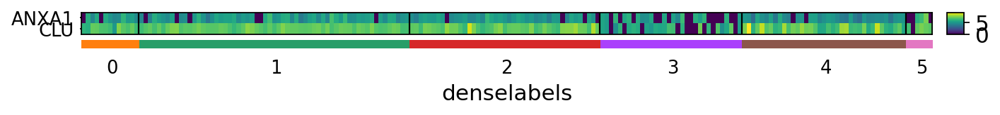

In [42]:
plot_rl_pairs(adata=adata_deconv,
              obs_key='denselabels',
              denselabels=True,
              plot_heatmap=True,
              genes_heatmap=['ANXA1','CLU'])

/hpc/users/radkee01/.local/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


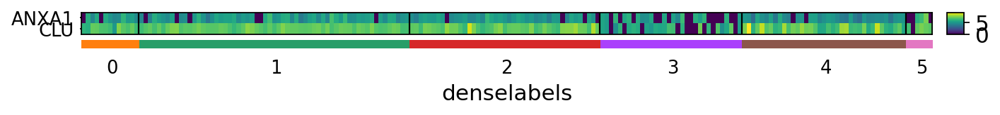

In [43]:
plot_heatmap_rl_pairs(adata=adata_deconv,
                      obs_key='denselabels',
                      topindex=None,
                      denselabels=True,
                      genes_heatmap=['ANXA1','CLU'])

# decoupler

calculate progeny, dorothea, cytosig and msigdb collections on all spots. sometimes it crashes with `kernel restarting` error -- it means that you need more RAM. 8 gb per node is ok.

In [44]:
ad_dc=calc_decoupler(adata=adata,
                     msigdb_collection=['reactome_pathways'],
                     ora=True,
                     precomp=False)

Normalizing, log-transforming.
Loading pre-loaded progeny database
Running progeny
45 features of mat are empty, they will be removed.
Running mlm on mat with 19528 samples and 17898 targets for 14 sources.


100%|██████████| 2/2 [00:08<00:00,  4.17s/it]


Loading pre-loaded dorothea database
Running dorothea
45 features of mat are empty, they will be removed.
Running mlm on mat with 19528 samples and 17898 targets for 297 sources.


100%|██████████| 2/2 [00:10<00:00,  5.49s/it]


Loading pre-loaded cytosig database
Running CytoSig
45 features of mat are empty, they will be removed.
Running mlm on mat with 19528 samples and 17898 targets for 41 sources.


100%|██████████| 2/2 [00:07<00:00,  3.89s/it]


Loading pre-loaded msigdb database
Extracting reactome_pathways
Running ora
45 features of mat are empty, they will be removed.
Running ora on mat with 19528 samples and 17898 targets for 1632 sources.


100%|██████████| 19528/19528 [03:15<00:00, 99.89it/s] 
/hpc/users/radkee01/.local/lib/python3.8/site-packages/pandas/core/internals/blocks.py:351: RuntimeWarning: divide by zero encountered in log10
  result = func(self.values, **kwargs)


In [52]:
gs=get_geneset_pairs(adata=adata,
                     msigdb_collection=['reactome_pathways'])

Loading pre-loaded progeny database
Loading pre-loaded dorothea database
Loading pre-loaded msigdb database


get activities and group activities for any decoupler calculation. group them and plot on UMAP

In [53]:
acts=get_activities(adata=ad_dc,
                    obsm_key='reactome_pathways_ora_estimate')
acts_gr=get_activities_per_group(acts=acts,
                                 group_name='pathologist_annotation')

/usr/local/lib/python3.8/dist-packages/seaborn/matrix.py:1203: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(**tight_params)


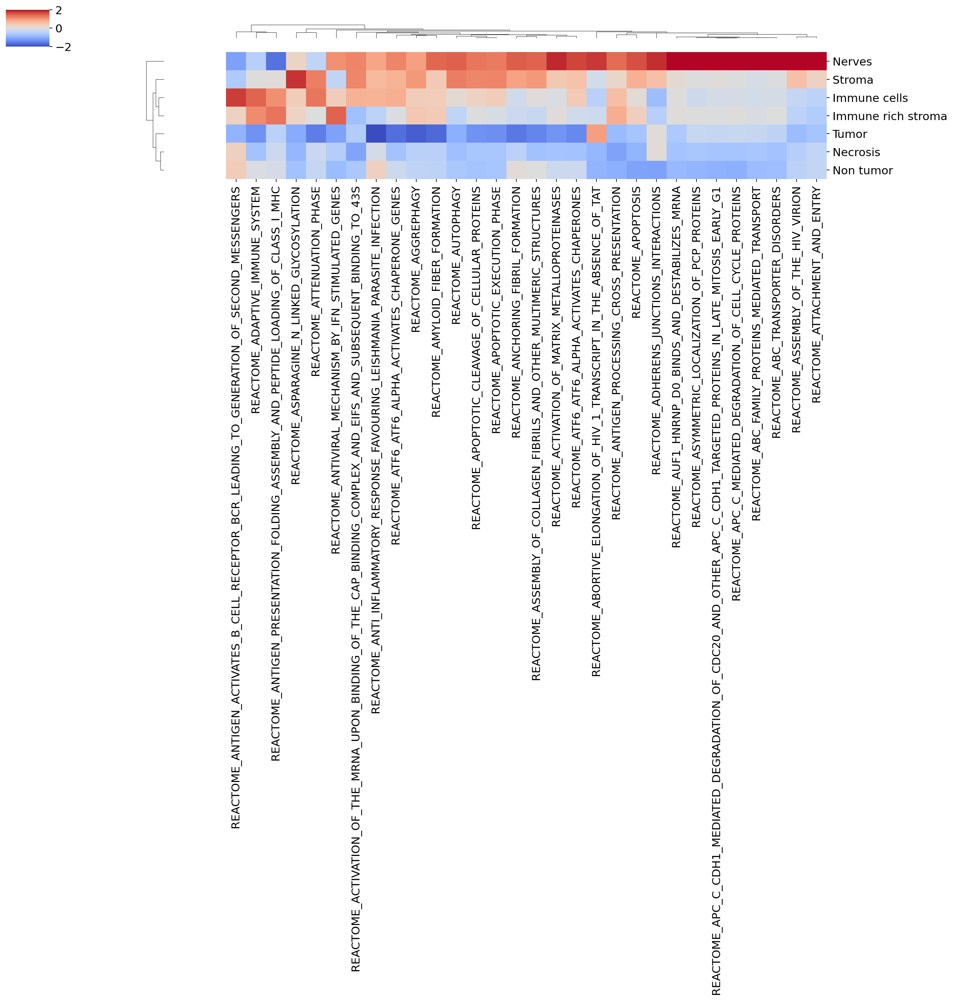

In [54]:
clustermap_of_activities(acts_gr.iloc[:,:30])

/usr/local/lib/python3.8/dist-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


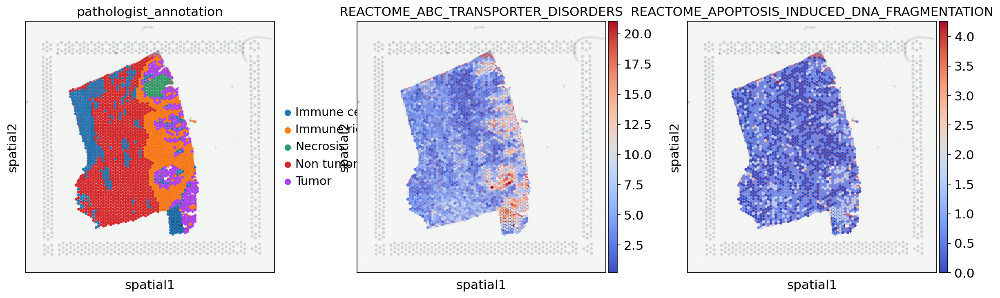

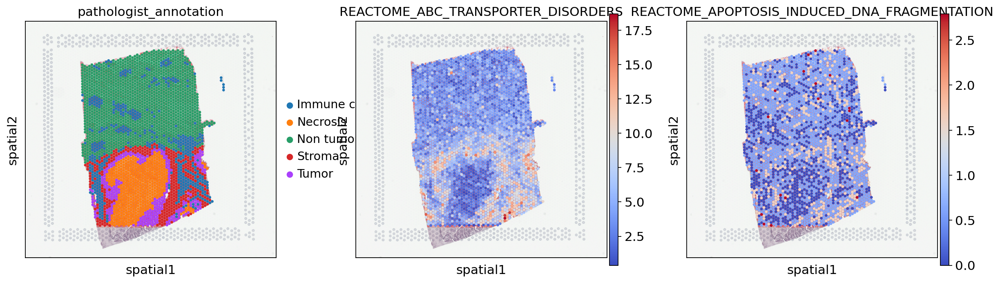

In [58]:
plot_spatial_scatter(acts,'samples',['MIME22_BIC18-A5_0','MIME22_BIC18-A7_0'],
                     True,
                     *['pathologist_annotation',
                       *['REACTOME_ABC_TRANSPORTER_DISORDERS',
                         'REACTOME_APOPTOSIS_INDUCED_DNA_FRAGMENTATION']])

## one sample example

In [59]:
dc_df=pd.concat([ad_dc.obsm[i] for i in ad_dc.obsm if 'estimate' in i],axis=1).replace({np.inf:0})

In [60]:
adata_deconv.obsm['decoupler']=dc_df.reindex(adata_deconv.obs_names)

In [61]:
acts=get_activities(adata=adata_deconv,
                    obsm_key='decoupler')
# acts_gr=get_activities_per_group(acts,'pathologist_annotation')

you can calculate most important features for any group in any .obs name

In [62]:
sc.tl.rank_genes_groups(acts,groupby='leiden_deconv')

/hpc/users/radkee01/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/hpc/users/radkee01/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/hpc/users/radkee01/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/hpc/users/radkee01/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/hpc/users/radkee01/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/hpc/

for example first cluster in leiden clustering calculated on deconvolution is definitely enriched in myofibroblasts

In [63]:
gr='1'
rnk=acts.uns['rank_genes_groups']
masked=rnk['names'][gr][rnk['pvals_adj'][gr]<0.05]
tohighlight=masked[:5]
print(tohighlight)

['KLF5' 'REACTOME_CELL_CELL_JUNCTION_ORGANIZATION'
 'REACTOME_EPITHELIAL_MESENCHYMAL_TRANSITION_EMT_DURING_GASTRULATION'
 'REACTOME_ADHERENS_JUNCTIONS_INTERACTIONS' 'HNF4A']


/usr/local/lib/python3.8/dist-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


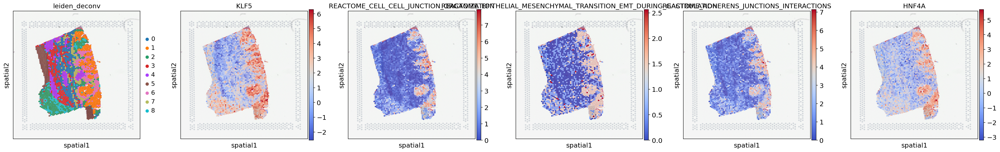

In [64]:
plot_spatial_scatter(acts,'samples',None,True,
                     *['leiden_deconv',*tohighlight])

check expression of genes in specified geneset

Length of genes to plot = 99


/hpc/users/radkee01/.local/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


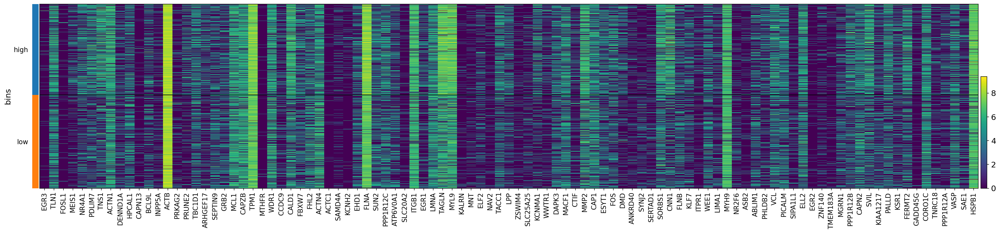

In [65]:
plot_hm_gs(activities=acts,
           adata=adata_deconv,
           label='SRF',
           gs=gs)